# Gravity data processing

In [1]:
import pathlib
import numpy as np
import pandas as pd
import pyproj
import pygmt
import ensaio
import verde as vd
import boule as bl
import harmonica as hm
import pyvista as pv

In [2]:
figsdir = pathlib.Path("..") / "poster" / "figs"
if not figsdir.exists():
    figsdir.mkdir(parents=True)

In [3]:
datadir = pathlib.Path("..") / "data"

In [4]:
# Define region to crop Bushveld Igenous Complex
region = (25, 32, -28, -23)
region_pad = vd.pad_region(region, pad=5)
region_pad

(20, 37, -33, -18)

## Download datasets

In [5]:
path_gravity = ensaio.fetch_southern_africa_gravity(version=1)

Load data

In [6]:
raw_data = pd.read_csv(path_gravity)
raw_data

,longitude,latitude,height_sea_level_m,gravity_mgal
0,18.34444,-34.12971,32.2,979656.12
1,18.36028,-34.08833,592.5,979508.21
2,18.37418,-34.19583,18.4,979666.46
3,18.40388,-34.23972,25.0,979671.03
4,18.41112,-34.16444,228.7,979616.11
...,...,...,...,...
14354,21.22500,-17.95833,1053.1,978182.09
14355,21.27500,-17.98333,1033.3,978183.09
14356,21.70833,-17.99166,1041.8,978182.69
14357,21.85000,-17.95833,1033.3,978193.18


In [7]:
topography = hm.load_icgem_gdf(datadir / "etopo1-2250_02.gdf").topography_grd
topography.name = "topography"
topography

<xarray.DataArray 'topography' (latitude: 751, longitude: 851)>
array([[ 6.03000e+02,  6.16200e+02,  6.28200e+02, ..., -5.05140e+03,
        -5.05700e+03, -5.06600e+03],
       [ 6.17200e+02,  6.27640e+02,  6.42040e+02, ..., -5.01132e+03,
        -5.02348e+03, -5.03420e+03],
       [ 6.22800e+02,  6.82920e+02,  7.13480e+02, ..., -4.98252e+03,
        -5.01852e+03, -5.04580e+03],
       ...,
       [ 1.10780e+03,  1.10480e+03,  1.10144e+03, ...,  1.00000e+00,
        -1.72000e+00, -4.40000e+00],
       [ 1.10620e+03,  1.10296e+03,  1.10088e+03, ..., -8.40000e-01,
        -5.20000e-01, -3.20000e+00],
       [ 1.10300e+03,  1.10160e+03,  1.09920e+03, ...,  0.00000e+00,
         4.00000e+00,  0.00000e+00]])
Coordinates:
  * longitude  (longitude) float64 20.0 20.02 20.04 20.06 ... 36.96 36.98 37.0
  * latitude   (latitude) float64 -33.0 -32.98 -32.96 ... -18.04 -18.02 -18.0

In [8]:
geoid = hm.load_icgem_gdf(datadir / "EIGEN-6C4_geoid-02.gdf").geoid
geoid

<xarray.DataArray 'geoid' (latitude: 751, longitude: 851)>
array([[33.89026443, 33.91262457, 33.93744298, ..., 22.26576131,
        22.21457906, 22.16525439],
       [33.89455668, 33.92244333, 33.95221094, ..., 22.23053592,
        22.1778885 , 22.12712143],
       [33.89586774, 33.92859963, 33.96245181, ..., 22.19580482,
        22.14171348, 22.08952139],
       ...,
       [17.72789048, 17.68193789, 17.63422522, ..., -8.80506833,
        -8.76821067, -8.72991065],
       [17.65964786, 17.61469582, 17.56805411, ..., -8.84896698,
        -8.8111222 , -8.77173004],
       [17.59023702, 17.54645396, 17.50098381, ..., -8.89416328,
        -8.85527332, -8.81473664]])
Coordinates:
  * longitude  (longitude) float64 20.0 20.02 20.04 20.06 ... 36.96 36.98 37.0
  * latitude   (latitude) float64 -33.0 -32.98 -32.96 ... -18.04 -18.02 -18.0

### Plot raw data

Configure PyGMT plots

In [9]:
dark_mode = True
plot_frame_labels = False

if dark_mode:
    color = "white"
else:
    color = "black"

if plot_frame_labels:
    frame = "af"
else:
    frame = "f"
    
pygmt.config(
    FONT_ANNOT=f"11p,Helvetica,{color}",
    FONT_TITLE=f"12p,Helvetica,{color}",
    FONT_LABEL=f"10p,Helvetica,{color}",
    MAP_TITLE_OFFSET="0p",
    MAP_FRAME_WIDTH="2p",
)


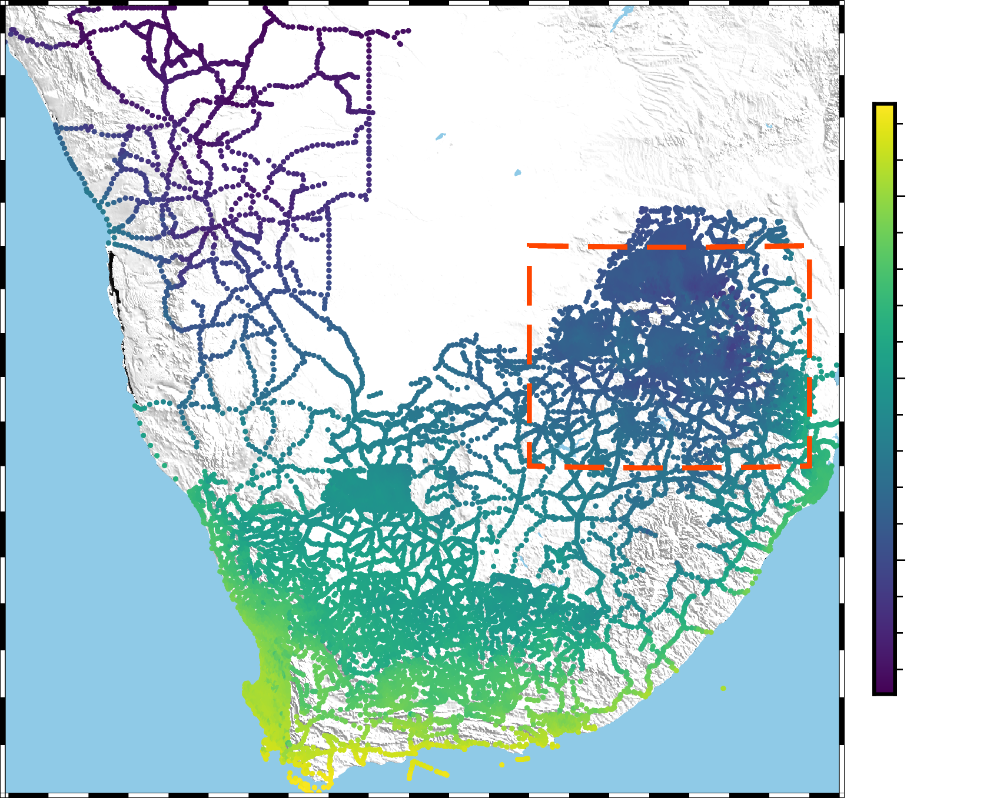

In [10]:
fig = pygmt.Figure()
gmt_projection = "M12c"

raw_region = vd.get_region((raw_data.longitude, raw_data.latitude))

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_01m",
    region=raw_region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
fig.coast(
    water="#8fcae7",
    transparency=50,
)
pygmt.makecpt(
    cmap="viridis",
    series=[raw_data.gravity_mgal.min(), raw_data.gravity_mgal.max()],
)
fig.plot(
    x=raw_data.longitude,
    y=raw_data.latitude,
    fill=raw_data.gravity_mgal,
    cmap=True,
    style="c2p",
    projection=gmt_projection,
    frame=frame,
)
fig.plot(
    x=[region[0], region[1], region[1], region[0], region[0]],
    y=[region[3], region[3], region[2], region[2], region[3]],
    pen="2p,orangered1,-",
)
# fig.colorbar(frame='af+l"mGal"')
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.savefig(figsdir / "southern-africa-raw-gravity.png", dpi=300, transparent=True)
fig.show()

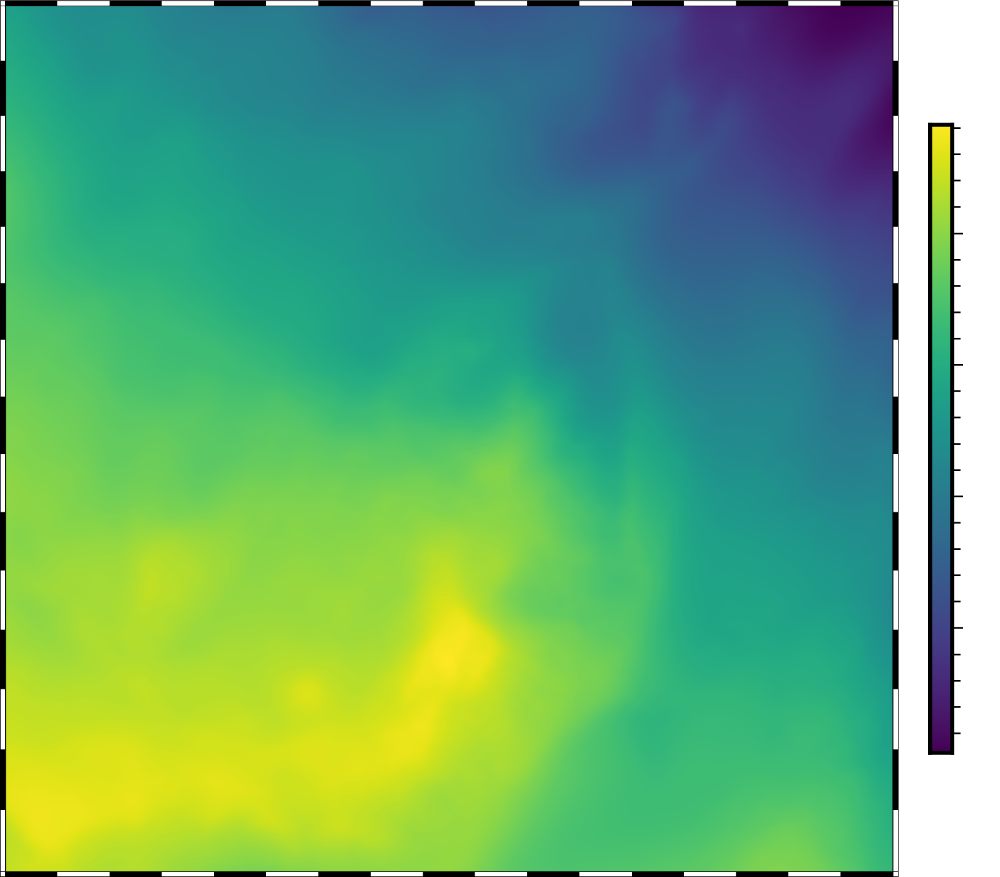

In [11]:
fig = pygmt.Figure()
gmt_projection = "M12c"

fig.grdimage(
    geoid,
    projection=gmt_projection,
    cmap="viridis",
    frame=frame,
)
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.show()

## Crop data

In [12]:
data = raw_data[vd.inside((raw_data.longitude, raw_data.latitude), region)]
data

,longitude,latitude,height_sea_level_m,gravity_mgal
7478,25.43668,-27.67833,1227.4,978783.95
7479,25.83000,-27.41667,1287.5,978744.16
7480,25.00000,-27.87167,1258.5,978786.05
7481,25.03168,-27.06168,1255.2,978757.56
7482,25.05000,-27.25166,1302.1,978724.47
...,...,...,...,...
12974,31.51500,-23.86333,300.5,978776.85
12975,31.52499,-23.30000,280.7,978798.55
12976,31.54832,-23.19333,245.7,978803.55
12977,31.57333,-23.84833,226.8,978808.44


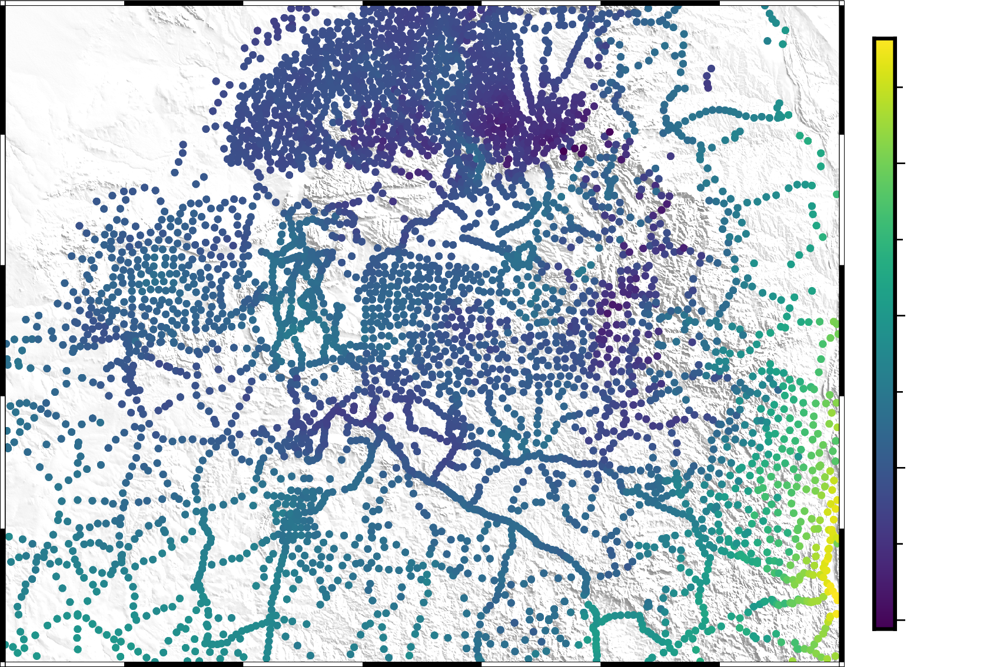

In [13]:
fig = pygmt.Figure()
gmt_projection = "M12c"

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="viridis",
    series=[data.gravity_mgal.min(), data.gravity_mgal.max()],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_mgal,
    cmap=True,
    style="c3p",
    projection=gmt_projection,
    frame=frame,
)
# fig.colorbar(frame='af+l"mGal"')
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.savefig(figsdir / "bushveld-raw-gravity.png", dpi=300, transparent=True)
fig.show()

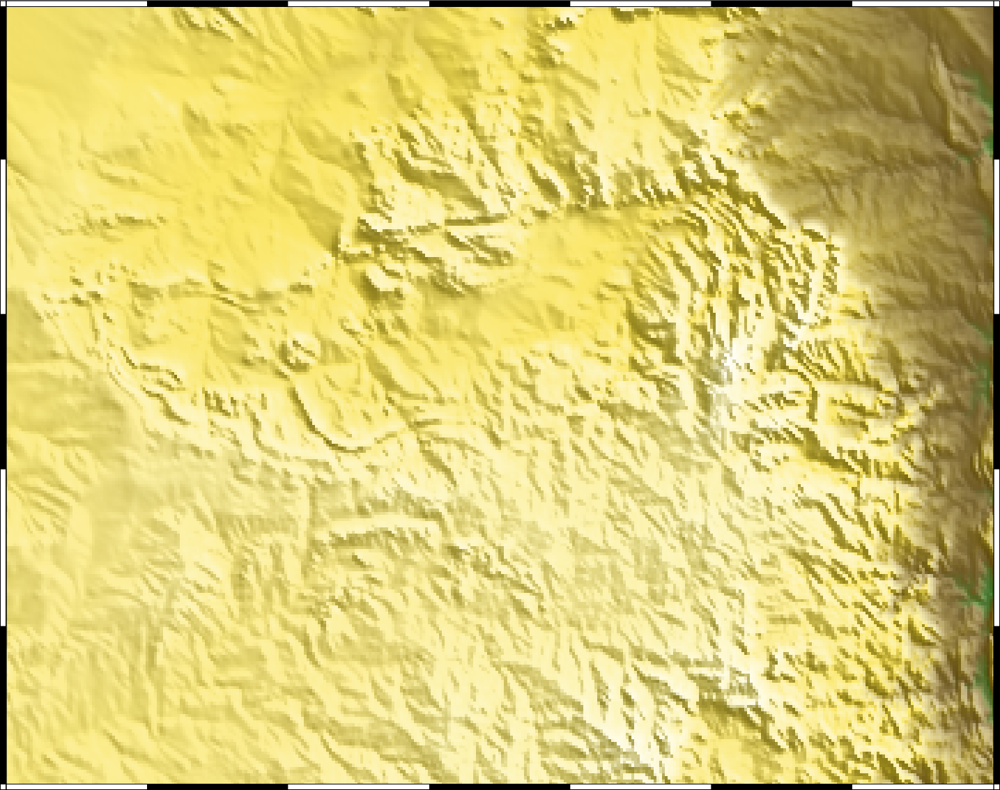

In [14]:
fig = pygmt.Figure()
gmt_projection = "M12c"

pygmt.makecpt(cmap="gray")
fig.grdimage(
    topography,
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap="relief",
    frame=frame,
)
fig.show()

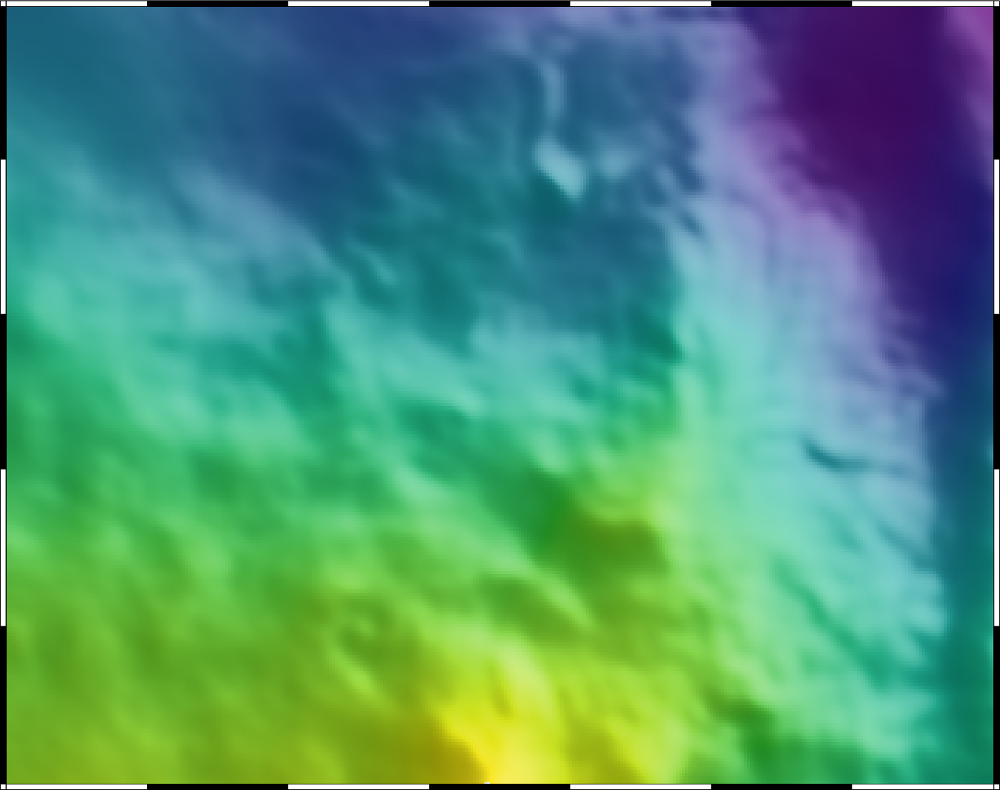

In [15]:
fig = pygmt.Figure()
gmt_projection = "M12c"

pygmt.makecpt(cmap="gray")
fig.grdimage(
    geoid,
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap="viridis",
    frame=frame,
)
fig.show()

## Project data

In [16]:
projection = pyproj.Proj(proj="merc", lat_ts=data.latitude.mean())

easting, northing = projection(data.longitude.values, data.latitude.values)
data = data.assign(easting_m=easting, northing_m=northing)

topography_proj = vd.project_grid(topography, projection, method="nearest")
geoid_proj = vd.project_grid(geoid, projection, method="nearest")

In [17]:
topography_proj

<xarray.DataArray 'topography' (northing: 751, easting: 851)>
array([[ 6.09600e+02,  6.09600e+02,  6.28200e+02, ..., -5.05420e+03,
        -5.05420e+03, -5.06600e+03],
       [ 6.22420e+02,  6.22420e+02,  6.42040e+02, ..., -5.01740e+03,
        -5.01740e+03, -5.03420e+03],
       [ 6.52860e+02,  6.52860e+02,  7.13480e+02, ..., -5.00052e+03,
        -5.00052e+03, -5.04580e+03],
       ...,
       [ 1.10630e+03,  1.10630e+03,  1.10144e+03, ..., -3.60000e-01,
        -3.60000e-01, -4.40000e+00],
       [ 1.10344e+03,  1.10344e+03,  1.10004e+03, ...,  6.60000e-01,
         6.60000e-01, -1.60000e+00],
       [ 1.10344e+03,  1.10344e+03,  1.10004e+03, ...,  6.60000e-01,
         6.60000e-01, -1.60000e+00]])
Coordinates:
  * easting   (easting) float64 2.013e+06 2.015e+06 ... 3.723e+06 3.725e+06
  * northing  (northing) float64 -3.502e+06 -3.499e+06 ... -1.833e+06 -1.831e+06
Attributes:
    metadata:  Generated by Chain(steps=[('mean',\n              BlockReduce(...

In [18]:
geoid_proj

<xarray.DataArray 'geoid' (northing: 751, easting: 851)>
array([[33.9014445 , 33.9014445 , 33.93744298, ..., 22.24017019,
        22.24017019, 22.16525439],
       [33.9085    , 33.9085    , 33.95221094, ..., 22.20421221,
        22.20421221, 22.12712143],
       [33.91223369, 33.91223369, 33.96245181, ..., 22.16875915,
        22.16875915, 22.08952139],
       ...,
       [17.70491418, 17.70491418, 17.63422522, ..., -8.7866395 ,
        -8.7866395 , -8.72991065],
       [17.60275867, 17.60275867, 17.53451896, ..., -8.85238145,
        -8.85238145, -8.79323334],
       [17.60275867, 17.60275867, 17.53451896, ..., -8.85238145,
        -8.85238145, -8.79323334]])
Coordinates:
  * easting   (easting) float64 2.013e+06 2.015e+06 ... 3.723e+06 3.725e+06
  * northing  (northing) float64 -3.502e+06 -3.499e+06 ... -1.833e+06 -1.831e+06
Attributes:
    metadata:  Generated by Chain(steps=[('mean',\n              BlockReduce(...

In [19]:
assert all(topography_proj.easting.values == geoid_proj.easting.values)

In [20]:
assert all(topography_proj.northing.values == geoid_proj.northing.values)

## Compute topography referenced on the ellipsoid

Unravel the grid so that we can pass it to the interpolator

In [21]:
geoid_table = vd.grid_to_table(geoid_proj)
interpolator = vd.ScipyGridder(method="cubic")
interpolator.fit((geoid_table.easting, geoid_table.northing), geoid_table.geoid)

ScipyGridder()

Predict the geoid height at same locations as the observation points

In [22]:
data = data.assign(geoid_m=interpolator.predict((data.easting_m, data.northing_m)))
data = data.assign(height_geometric_m=data.height_sea_level_m + data.geoid_m)

In [23]:
topography_geometric = topography_proj + geoid_proj
topography_geometric

<xarray.DataArray (northing: 751, easting: 851)>
array([[  643.5014445 ,   643.5014445 ,   662.13744298, ...,
        -5031.95982981, -5031.95982981, -5043.83474561],
       [  656.3285    ,   656.3285    ,   675.99221094, ...,
        -4995.19578779, -4995.19578779, -5012.07287857],
       [  686.77223369,   686.77223369,   747.44245181, ...,
        -4978.35124085, -4978.35124085, -5023.71047861],
       ...,
       [ 1124.00491418,  1124.00491418,  1119.07422522, ...,
           -9.1466395 ,    -9.1466395 ,   -13.12991065],
       [ 1121.04275867,  1121.04275867,  1117.57451896, ...,
           -8.19238145,    -8.19238145,   -10.39323334],
       [ 1121.04275867,  1121.04275867,  1117.57451896, ...,
           -8.19238145,    -8.19238145,   -10.39323334]])
Coordinates:
  * easting   (easting) float64 2.013e+06 2.015e+06 ... 3.723e+06 3.725e+06
  * northing  (northing) float64 -3.502e+06 -3.499e+06 ... -1.833e+06 -1.831e+06

## Gravity disturbance

In [24]:
data = data.assign(
    normal_gravity_mgal=bl.WGS84.normal_gravity(data.latitude, data.height_geometric_m)
)
data = data.assign(
    gravity_disturbance_mgal=data.gravity_mgal - data.normal_gravity_mgal
)

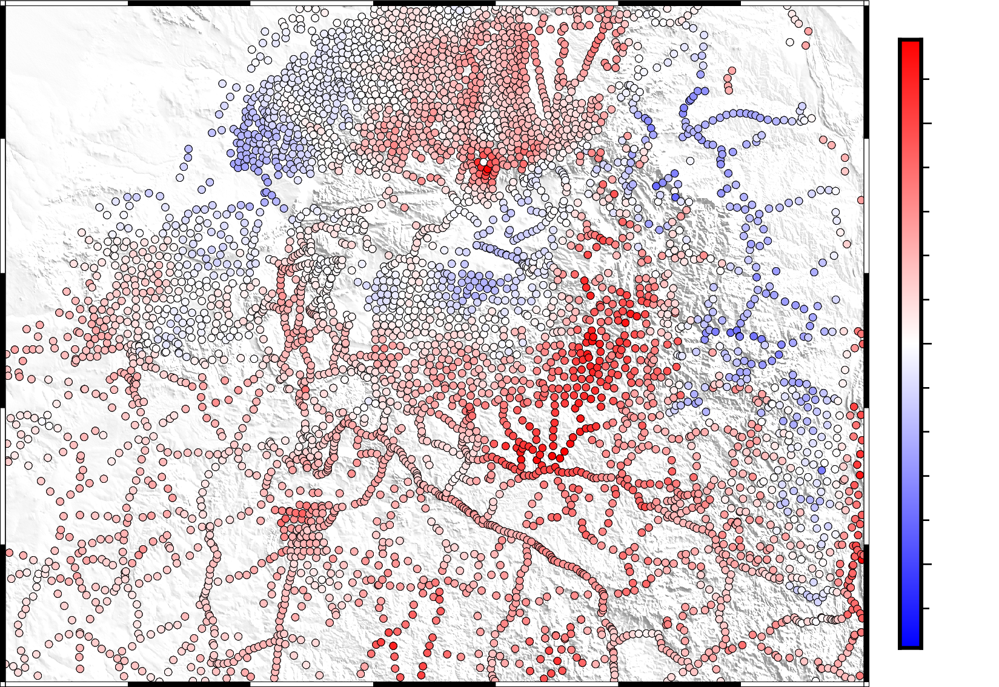

In [25]:
fig = pygmt.Figure()
gmt_projection = "M12c"

maxabs = vd.maxabs(data.gravity_disturbance_mgal)

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="polar",
    series=[-maxabs, maxabs],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_disturbance_mgal,
    cmap=True,
    style="c3p",
    pen="0.1p",
    projection=gmt_projection,
    frame=frame,
)
# fig.colorbar(frame='af+l"mGal"')
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.savefig(figsdir / "bushveld-gravity-disturbance.png", dpi=300, transparent=True)
fig.show()

## Topographic correction

In [26]:
topography_density = np.where(topography_geometric > 0, 2670, -2670)
topography_density = np.where(topography_proj < 0, 1040 - 2670, topography_density)
topography_model = hm.prism_layer(
    coordinates=(topography_geometric.easting, topography_geometric.northing),
    surface=topography_geometric,
    reference=0,
    properties={"density": topography_density},
)

In [27]:
topography

<xarray.DataArray 'topography' (latitude: 751, longitude: 851)>
array([[ 6.03000e+02,  6.16200e+02,  6.28200e+02, ..., -5.05140e+03,
        -5.05700e+03, -5.06600e+03],
       [ 6.17200e+02,  6.27640e+02,  6.42040e+02, ..., -5.01132e+03,
        -5.02348e+03, -5.03420e+03],
       [ 6.22800e+02,  6.82920e+02,  7.13480e+02, ..., -4.98252e+03,
        -5.01852e+03, -5.04580e+03],
       ...,
       [ 1.10780e+03,  1.10480e+03,  1.10144e+03, ...,  1.00000e+00,
        -1.72000e+00, -4.40000e+00],
       [ 1.10620e+03,  1.10296e+03,  1.10088e+03, ..., -8.40000e-01,
        -5.20000e-01, -3.20000e+00],
       [ 1.10300e+03,  1.10160e+03,  1.09920e+03, ...,  0.00000e+00,
         4.00000e+00,  0.00000e+00]])
Coordinates:
  * longitude  (longitude) float64 20.0 20.02 20.04 20.06 ... 36.96 36.98 37.0
  * latitude   (latitude) float64 -33.0 -32.98 -32.96 ... -18.04 -18.02 -18.0

In [28]:
pv_grid = topography_model.prism_layer.to_pyvista()
pv_grid["elevation"] = topography.values.ravel()
pv_grid

UnstructuredGrid (0x7fe69a55df00)
  N Cells:    639101
  N Points:   5112808
  X Bounds:   2.012e+06, 3.726e+06
  Y Bounds:   -3.503e+06, -1.830e+06
  Z Bounds:   -5.380e+03, 3.375e+03
  N Arrays:   2

In [29]:
points = pv.PolyData(np.vstack((data.easting_m, data.northing_m, data.height_geometric_m)).T)
points["gravity disturbance [mGal]"] = data.gravity_disturbance_mgal
points

PolyData (0x7fe69a55f040)
  N Cells:    4569
  N Points:   4569
  N Strips:   0
  X Bounds:   2.517e+06, 3.221e+06
  Y Bounds:   -2.920e+06, -2.365e+06
  Z Bounds:   1.169e+02, 2.168e+03
  N Arrays:   1

In [30]:
plot_3d = False

if plot_3d:
    plotter = pv.Plotter(lighting="three_lights", window_size=(1080 * 16 // 8, 1080), notebook=True)
    plotter.add_mesh(pv_grid, scalars="elevation", cmap="terrain", show_scalar_bar=False)
    plotter.set_scale(zscale=40)  # exaggerate the vertical coordinate
    
    plotter.add_points(
        points,
        cmap="RdBu_r",
        render_points_as_spheres=True,
        point_size=5,
    )
    
    plotter.camera_position = "xz"
    plotter.camera.elevation = 20
    plotter.camera.azimuth = 125
    plotter.camera.zoom(1.7)
    
    # Add a ceiling light
    west, east, south, north = vd.get_region((topography_model.easting, topography_model.northing))
    easting_center, northing_center = (east + west) / 2, (north + south) / 2
    light = pv.Light(
        position=(easting_center, northing_center, 10e3),
        focal_point=(easting_center, northing_center, 0),
        intensity=0.3,
        light_type="scene light",  # the light doesn't move with the camera
        positional=False,  # the light comes from infinity
    )
    plotter.add_light(light)
    
    plotter.show_axes()
    plotter.screenshot(figsdir / "topography-model.png", transparent_background=False)
    plotter.show()

In [31]:
%%time

coordinates = (data.easting_m, data.northing_m, data.height_geometric_m)
data = data.assign(
    terrain_effect_mgal=topography_model.prism_layer.gravity(coordinates, field="g_z"),
)
data = data.assign(
    gravity_bouguer_mgal=data.gravity_disturbance_mgal - data.terrain_effect_mgal
)

CPU times: user 30min 49s, sys: 1.4 s, total: 30min 51s
Wall time: 2min 41s


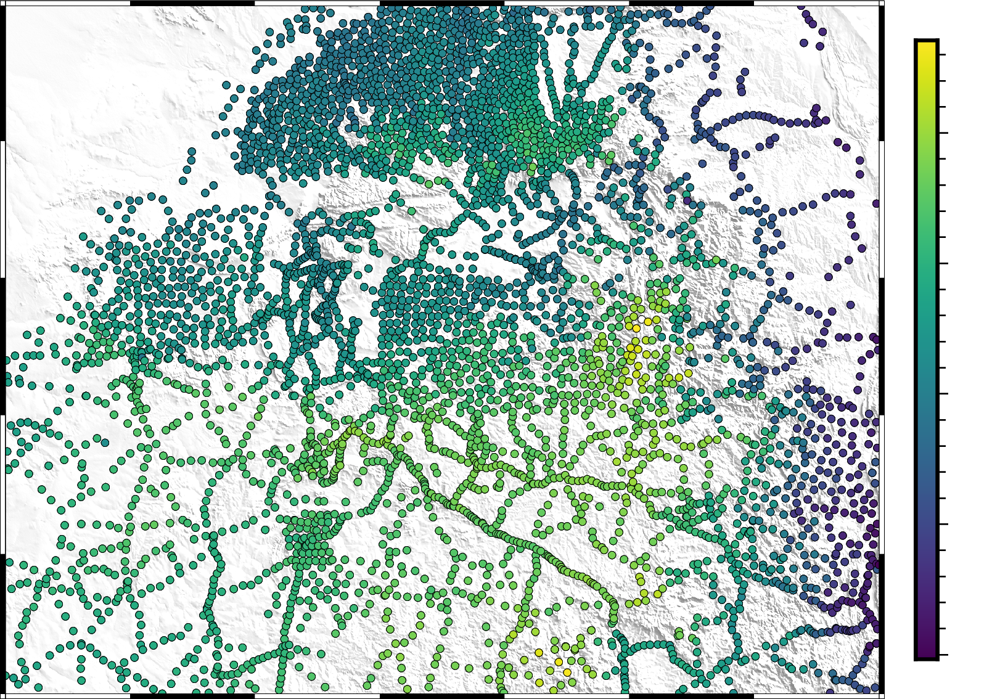

In [32]:
fig = pygmt.Figure()
gmt_projection = "M12c"

vmin = np.nanmin(data.terrain_effect_mgal)
vmax = np.nanmax(data.terrain_effect_mgal)

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)

pygmt.makecpt(
    cmap="viridis",
    series=[vmin, vmax],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.terrain_effect_mgal,
    cmap=True,
    style="c3p",
    pen="0.1p",
    projection=gmt_projection,
    frame=frame,
)
# fig.colorbar(frame='af+l"mGal"')
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.savefig(figsdir / "bushveld-terrain-correction.png", dpi=300, transparent=True)
fig.show()

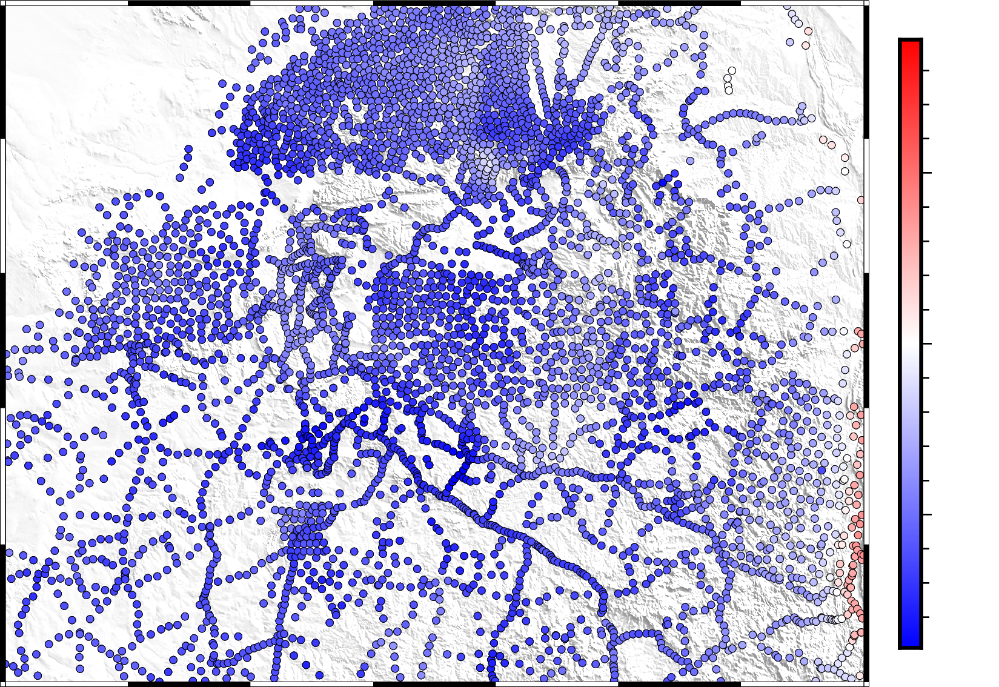

In [33]:
fig = pygmt.Figure()
gmt_projection = "M12c"

maxabs = vd.maxabs(data.gravity_bouguer_mgal)

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="polar",
    series=[-maxabs, maxabs],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_bouguer_mgal,
    cmap=True,
    style="c3p",
    pen="0.1p",
    projection=gmt_projection,
    frame=frame,
)
# fig.colorbar(frame='af+l"mGal"')
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.savefig(figsdir / "bushveld-bouguer.png", dpi=300, transparent=True)
fig.show()

## Residual-regional separation

In [34]:
# Create a set of deep sources at a depth of 500 km
deep_sources = hm.EquivalentSources(damping=1000, depth=500e3)
# Fit the sources to the data
deep_sources.fit(
    (data.easting_m, data.northing_m, data.height_geometric_m),
    data.gravity_bouguer_mgal,
)

EquivalentSources(damping=1000, depth=500000.0)

In [35]:
# Use the sources to predict the regional field
data = data.assign(
    gravity_regional_mgal=deep_sources.predict(
        (data.easting_m, data.northing_m, data.height_geometric_m)
    )
)
# Calculate a residual field (which is what we want)
data = data.assign(
    gravity_residual_mgal=data.gravity_bouguer_mgal - data.gravity_regional_mgal
)

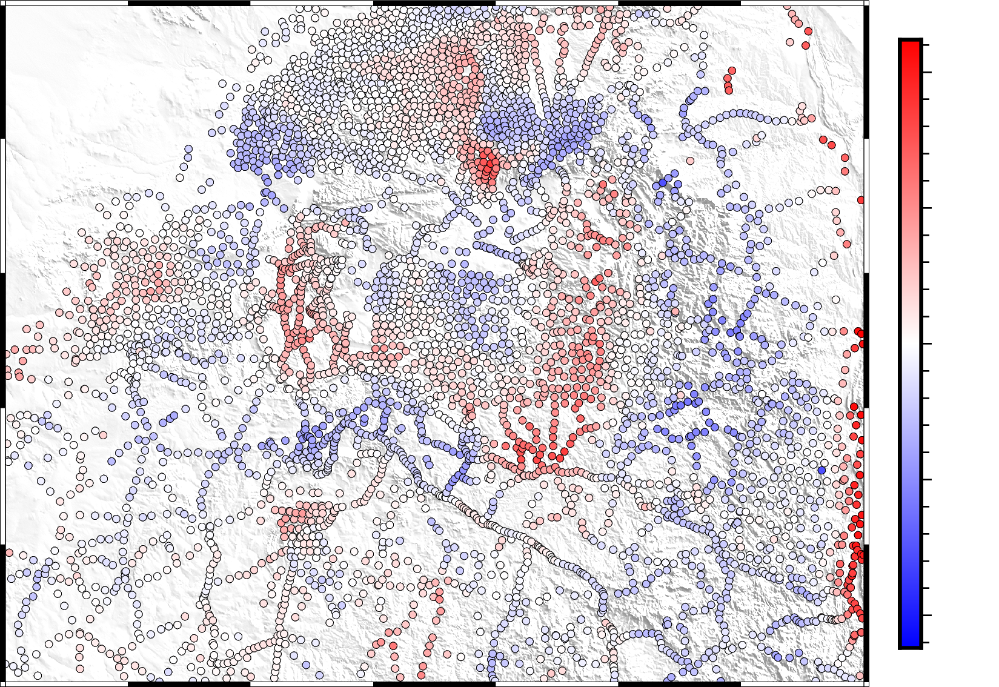

In [36]:
fig = pygmt.Figure()
gmt_projection = "M12c"

maxabs = vd.maxabs(data.gravity_residual_mgal)

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)
pygmt.makecpt(
    cmap="polar",
    series=[-maxabs, maxabs],
)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    fill=data.gravity_residual_mgal,
    cmap=True,
    style="c3p",
    pen="0.1p",
    projection=gmt_projection,
    frame=frame,
)
# fig.colorbar(frame='af+l"mGal"')
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.savefig(figsdir / "bushveld-residual.png", dpi=300, transparent=True)
fig.show()

## Grid the residual

In [37]:
eqs = hm.EquivalentSources(damping=10, depth=5e3)
eqs.fit(
    (data.easting_m, data.northing_m, data.height_geometric_m),
    data.gravity_residual_mgal,
)
grid_coords = vd.grid_coordinates(
    region=region,
    spacing=2 / 60,  # Decimal degrees
    extra_coords=2200,  # height in meters
)
residual_grid = eqs.grid(
    coordinates=grid_coords,
    data_names=["gravity_residual"],
    dims=("latitude", "longitude"),
    projection=projection,
)

In [38]:
residual_grid = vd.convexhull_mask((data.longitude, data.latitude), grid=residual_grid)
residual_grid

<xarray.Dataset>
Dimensions:           (latitude: 151, longitude: 211)
Coordinates:
  * longitude         (longitude) float64 25.0 25.03 25.07 ... 31.93 31.97 32.0
  * latitude          (latitude) float64 -28.0 -27.97 -27.93 ... -23.03 -23.0
    upward            (latitude, longitude) float64 2.2e+03 2.2e+03 ... 2.2e+03
Data variables:
    gravity_residual  (latitude, longitude) float64 nan nan nan ... nan nan nan
Attributes:
    metadata:  Generated by EquivalentSources(damping=10, depth=5000.0)

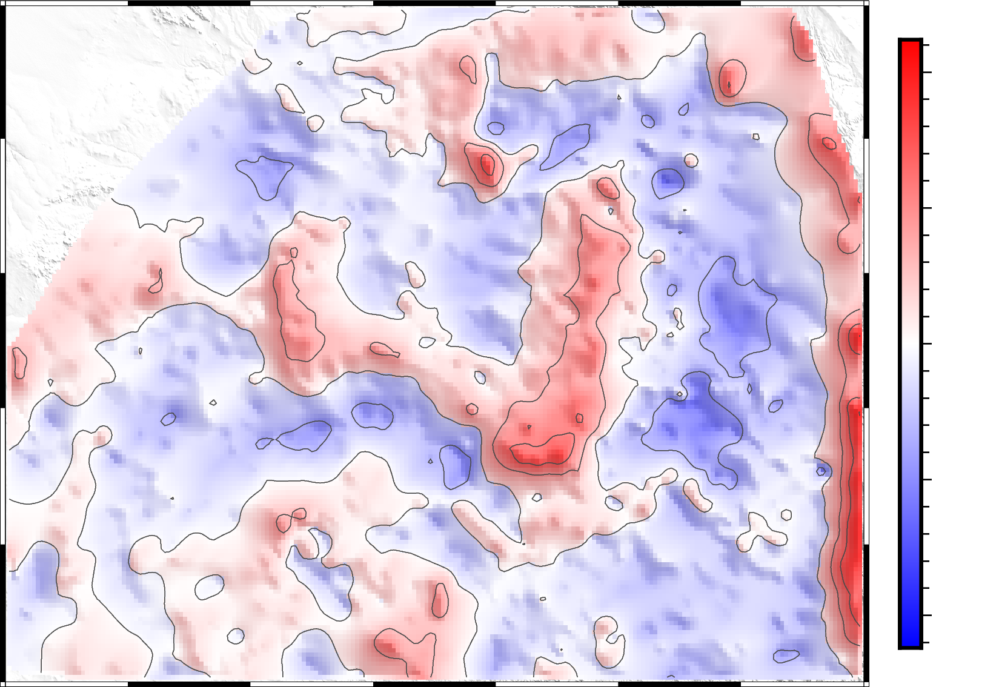

In [39]:
fig = pygmt.Figure()
gmt_projection = "M12c"

pygmt.makecpt(cmap="gray")
fig.grdimage(
    "@earth_relief_15s",
    region=region,
    projection=gmt_projection,
    shading="+a45+nt0.7",
    cmap=True,
)

pygmt.makecpt(cmap="polar", series=[-maxabs, maxabs], no_bg=True)
fig.grdimage(
    residual_grid.gravity_residual,
    shading="+a45+nt0.3",
    projection=gmt_projection,
    nan_transparent=True,
    frame=frame,
)
fig.grdcontour(
    residual_grid.gravity_residual,
    projection=gmt_projection,
    interval=30,
    pen="#4a4a4a"
)

# fig.colorbar(frame='af+l"mGal"')
fig.colorbar(position="JMR+o0.5c/0c+w8.5c/0.3c", frame=['af', 'y+l"mGal"'])

fig.savefig(figsdir / "bushveld-residual-grid.png", dpi=300, transparent=True)
fig.show()